# Setup

In [1]:
import sys
sys.path.append("../")

In [2]:
import numpy as np
import cv2
import torch
from inverse_warp import inverse_warp
import matplotlib.pyplot as plt

In [3]:
def photometric_loss(img, depth_img, pose, intrinsics):
    warped_img, valid_points = inverse_warp(img, depth_img, pose, intrinsics)
    
    diff = (img - warped_img) * valid_points.unsqueeze(1).float()
    return diff.abs().mean(), diff, warped_img, valid_points

In [4]:
def intrinsics(img_size=64, fov=20):
    focal_length = (fov/2) / np.tan((img_size/2))

    intrinsics = np.array([[focal_length, 0, img_size/2],
                           [0, focal_length, img_size/2],
                           [0, 0, 1]])
    intrinsics = torch.from_numpy(intrinsics.astype(np.float32)).unsqueeze(0)
    return intrinsics

In [5]:
intrinsics()

tensor([[[15.1285,  0.0000, 32.0000],
         [ 0.0000, 15.1285, 32.0000],
         [ 0.0000,  0.0000,  1.0000]]])

In [6]:
def depth_plane(img_size=64, depth=150):
    depth_plane = np.full((img_size, img_size, 1), depth, dtype=np.uint8)

    depth_plane = np.transpose(depth_plane, (2, 0, 1))
    depth_plane = torch.from_numpy(depth_plane.astype(np.float32))
    
    return depth_plane

In [7]:
depth_plane()

tensor([[[150., 150., 150.,  ..., 150., 150., 150.],
         [150., 150., 150.,  ..., 150., 150., 150.],
         [150., 150., 150.,  ..., 150., 150., 150.],
         ...,
         [150., 150., 150.,  ..., 150., 150., 150.],
         [150., 150., 150.,  ..., 150., 150., 150.],
         [150., 150., 150.,  ..., 150., 150., 150.]]])

In [8]:
def convert_frame_to_tensor(frame):
    return torch.from_numpy(np.transpose(frame, (2, 0, 1)).astype(np.float32)).unsqueeze(0)

def convert_tensor_to_frame(tensor):
    return np.abs(np.transpose(tensor.squeeze(0), (1, 2, 0)).numpy()).astype(np.uint8)

In [9]:
def deg2rad_yaw(deg):
    return (deg * np.pi / 180)

def deg2rad_pitch(deg):
    return -((deg * np.pi / 180))

## Custom dataset

In [10]:
import json
import glob
from pathlib import Path
from collections import defaultdict
import imageio

dataset = defaultdict(list)

for act in [Path(dir) for dir in glob.glob("../mc/mc_predefinied_agent_actions_v2/*/")]:
    samples = [Path(dir) for dir in glob.glob(str(act.joinpath("*")))]
    samples.sort()
    for sample in samples:
        actions = np.load(str(sample.joinpath("actions.npy")), allow_pickle=True)
        
        frames = []
        n_frames = len(glob.glob(str(sample.joinpath("frames", "*.png"))))
        for i in range(n_frames):
            frames.append(imageio.imread(str(sample.joinpath("frames", f"{i}.png"))))

        data = {
            "frames": frames,
            "actions": actions,
            "sample": sample.name
        }
            
        dataset[act.name].append(data)

## Minerl dataset

# Single image

In [11]:
def visualize_diff(frame, next_frame, depth_tensor, pose_tensor, intrinsics, interactive=False):
    frame_tensor = convert_frame_to_tensor(frame)
    
    next_frame_tensor = convert_frame_to_tensor(next_frame)

    warped_frame_tensor, valid_points = inverse_warp(frame_tensor, depth_tensor, pose_tensor, intrinsics)
        
    diff = (next_frame_tensor - warped_frame_tensor) * valid_points.unsqueeze(1).float()
    
    loss = diff.abs().mean()
    
    warped_frame = convert_tensor_to_frame(warped_frame_tensor)
    
    diff_img = convert_tensor_to_frame(diff)
    
    # diffs
    warped_frame_hsv = np.empty(warped_frame.shape)
    warped_frame_hsv = cv2.cvtColor(warped_frame, cv2.COLOR_RGB2HSV)
    warped_frame_hs_tensor = convert_frame_to_tensor(warped_frame_hsv[:,:,:2])
    
    next_frame_hsv = np.empty(next_frame.shape)
    next_frame_hsv = cv2.cvtColor(next_frame, cv2.COLOR_RGB2HSV)
    next_frame_hs_tensor = convert_frame_to_tensor(next_frame_hsv[:,:,:2])
    
    diff_hs_tensor = (next_frame_hs_tensor - warped_frame_hs_tensor) * valid_points.unsqueeze(1).float()

    loss_hs = diff_hs_tensor.abs().mean()
    diff_hs_img = convert_tensor_to_frame(diff_hs_tensor)    
    
    diff_img_sum = np.abs(diff_img[:,:,0]) + np.abs(diff_img[:,:,1]) + np.abs(diff_img[:,:,2])
    diff_hs_img_sum = np.abs(diff_hs_img[:,:,0]) + np.abs(diff_hs_img[:,:,1])
        
    
    print(f"pose: {pose_tensor.numpy()}, loss RGB: {float(loss)}, loss HS {float(loss_hs)}")
    
    if interactive:
        import plotly.graph_objects as go
        from plotly.subplots import make_subplots
        
        fig = make_subplots(rows=2, cols=3,
                            subplot_titles=("orig frame", "next frame", "warped orig frame", "diff", "HS diff"),
                            vertical_spacing=0.05)
        fig.add_trace(go.Image(z=frame), row=1, col=1)
        fig.add_trace(go.Image(z=next_frame), row=1, col=2)
        fig.add_trace(go.Image(z=warped_frame), row=1, col=3)
        
        fig.add_trace(go.Heatmap(z=diff_img_sum, zmin=0, zmax=255*3), row=2, col=1)
        fig.add_trace(go.Heatmap(z=diff_hs_img_sum, zmin=0, zmax=255*3), row=2, col=2)
        
        fig.update_xaxes(matches="x")
        fig.update_yaxes(matches="y")
        
        fig.update_layout(height=800, width=1000)
        
        fig.show()
    else:
        plt.figure(figsize=(20, 20))
        plt.subplot(1, 3, 1)
        plt.imshow(frame)
        plt.subplot(1, 3, 2)
        plt.imshow(next_frame)
        plt.subplot(1, 3, 3)
        plt.imshow(warped_frame)
        plt.show()

        plt.figure(figsize=(20, 20))
        plt.subplot(1, 2, 1)
        plt.title("RGB diff")
        plt.imshow(diff_img_sum, vmin=0, vmax=255*3, cmap="gray", interpolation="nearest")
        plt.subplot(1, 2, 2)
        plt.title("HS diff")
        plt.imshow(diff_hs_img_sum, vmin=0, vmax=255*3, cmap="gray", interpolation="nearest")
        plt.show()

## Rotation: yaw

### 5deg

OrderedDict([('attack', 0), ('back', 0), ('camera', array([0, 5])), ('forward', 0), ('jump', 0), ('left', 0), ('right', 0), ('sneak', 0), ('sprint', 0)])


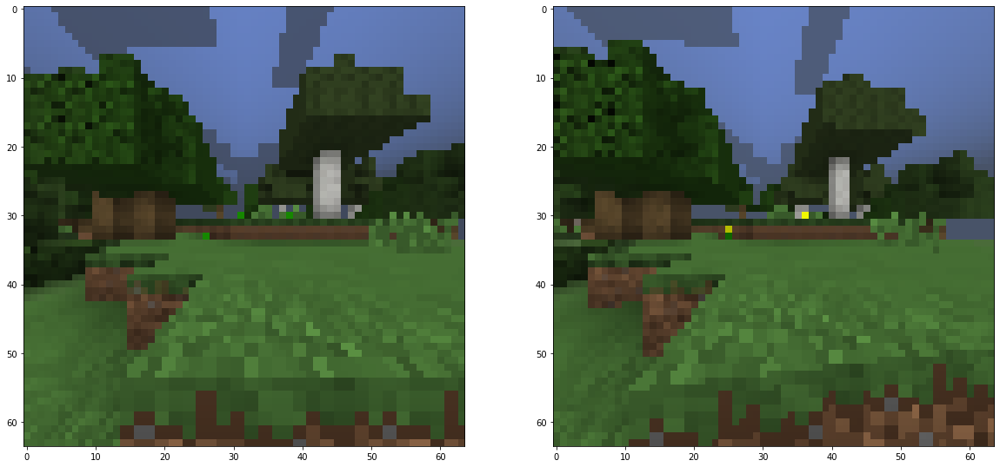

In [12]:
action_name = "camera_yaw_5"
sample = 0
frame = 0

sample = dataset[action_name][sample]

first_frame = sample["frames"][frame]

second_frame = sample["frames"][frame + 1]

action = sample["actions"][frame]
print(action)
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(first_frame)
plt.subplot(1, 2, 2)
plt.imshow(second_frame)
plt.show()

pose: [[ 0.          0.          0.         -0.          0.08726646  0.        ]], loss RGB: 6.432012557983398, loss HS 3.9869384765625


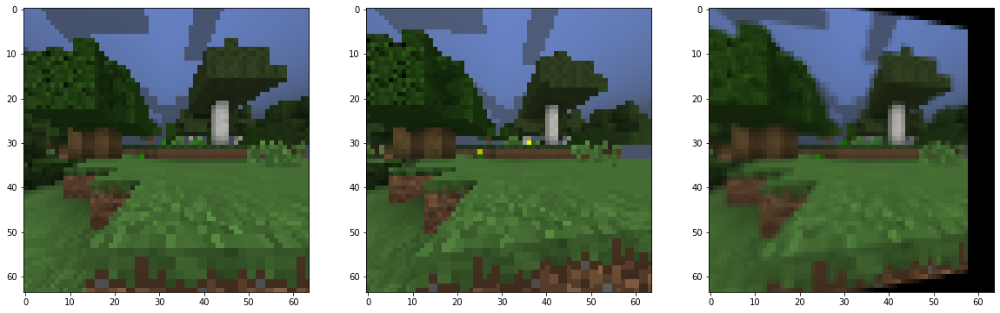

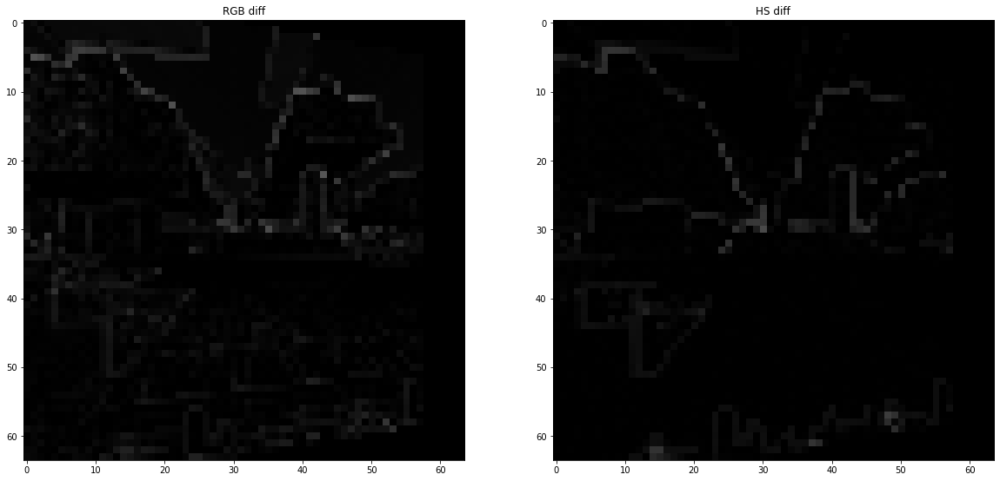

In [13]:
pose = np.array([0, 0, 0, deg2rad_pitch(action["camera"][0]), deg2rad_yaw(action["camera"][1]), 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics())

pose: [[ 0.          0.          0.         -0.          0.08726646  0.        ]], loss RGB: 6.432012557983398, loss HS 3.9869384765625


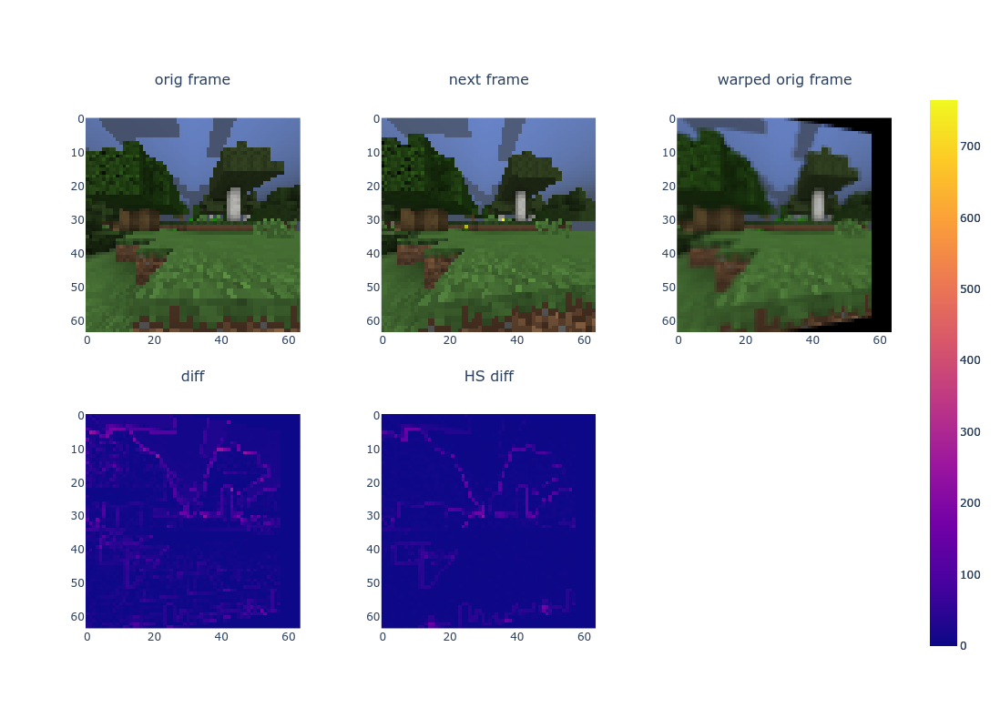

In [14]:
pose = np.array([0, 0, 0, deg2rad_pitch(action["camera"][0]), deg2rad_yaw(action["camera"][1]), 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics(), interactive=True)

### 10deg

OrderedDict([('attack', 0), ('back', 0), ('camera', array([ 0, 10])), ('forward', 0), ('jump', 0), ('left', 0), ('right', 0), ('sneak', 0), ('sprint', 0)])


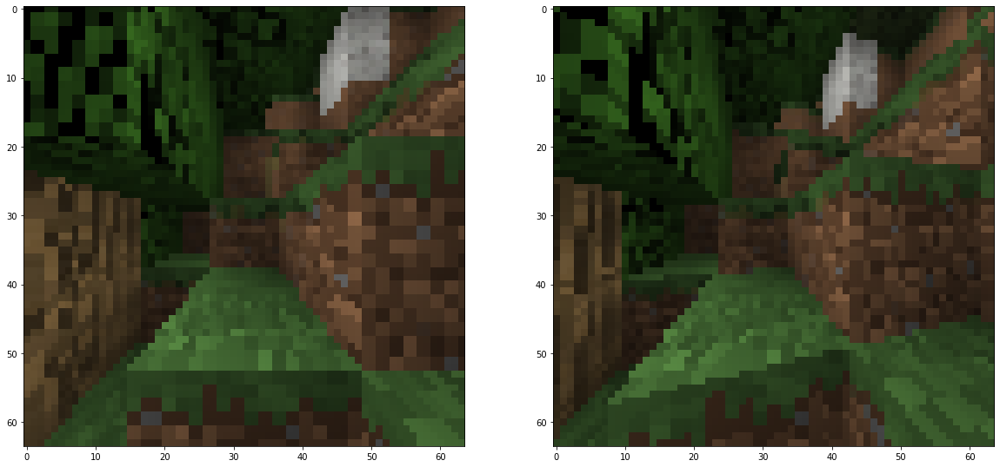

In [15]:
action_name = "camera_yaw_10"
sample = 3
frame = 9

sample = dataset[action_name][sample]

first_frame = sample["frames"][frame]

second_frame = sample["frames"][frame + 1]

action = sample["actions"][frame]
print(action)
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(first_frame)
plt.subplot(1, 2, 2)
plt.imshow(second_frame)
plt.show()

pose: [[ 0.          0.          0.         -0.          0.17453292  0.        ]], loss RGB: 4.409089088439941, loss HS 4.736572265625


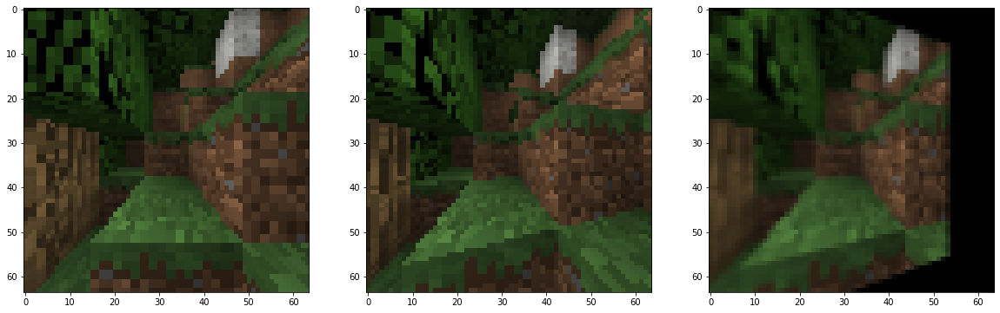

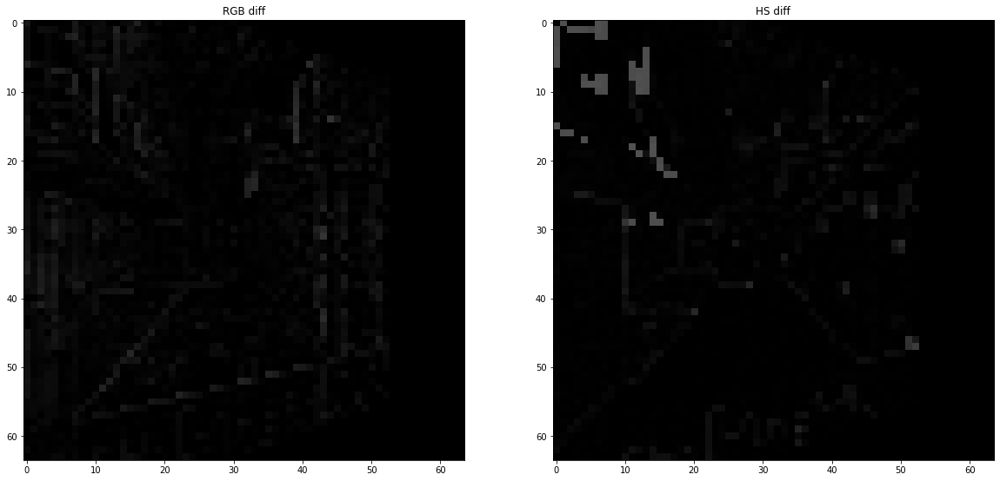

In [16]:
pose = np.array([0, 0, 0, deg2rad_pitch(action["camera"][0]), deg2rad_yaw(action["camera"][1]), 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics())

pose: [[ 0.          0.          0.         -0.          0.17453292  0.        ]], loss RGB: 4.409089088439941, loss HS 4.736572265625


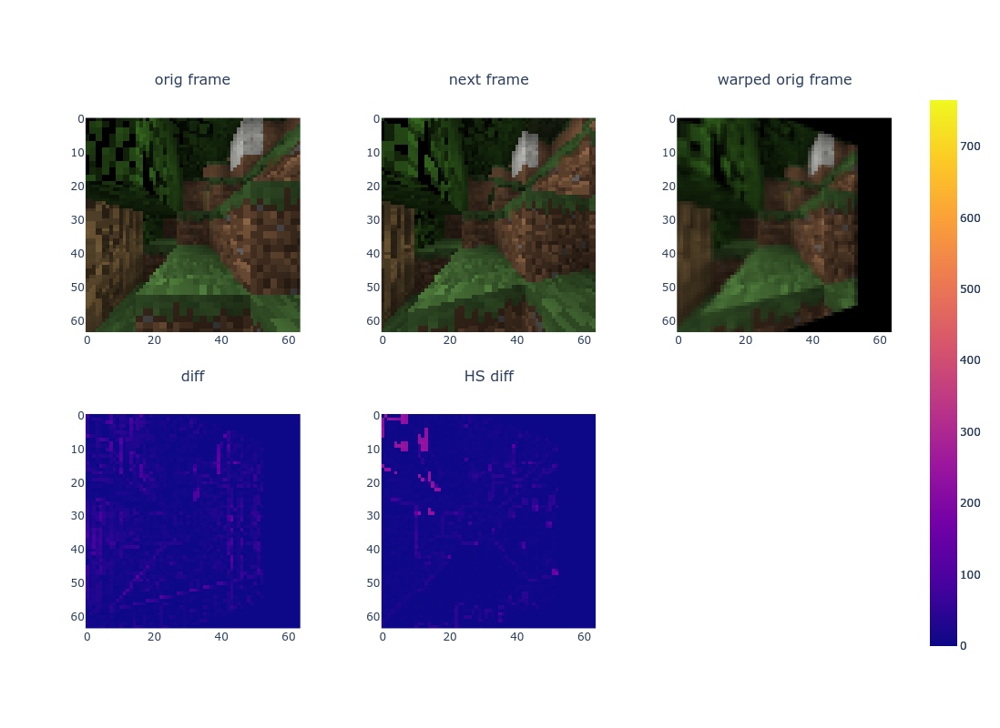

In [17]:
pose = np.array([0, 0, 0, deg2rad_pitch(action["camera"][0]), deg2rad_yaw(action["camera"][1]), 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics(), interactive=True)

### 30deg

OrderedDict([('attack', 0), ('back', 0), ('camera', array([ 0, 30])), ('forward', 0), ('jump', 0), ('left', 0), ('right', 0), ('sneak', 0), ('sprint', 0)])


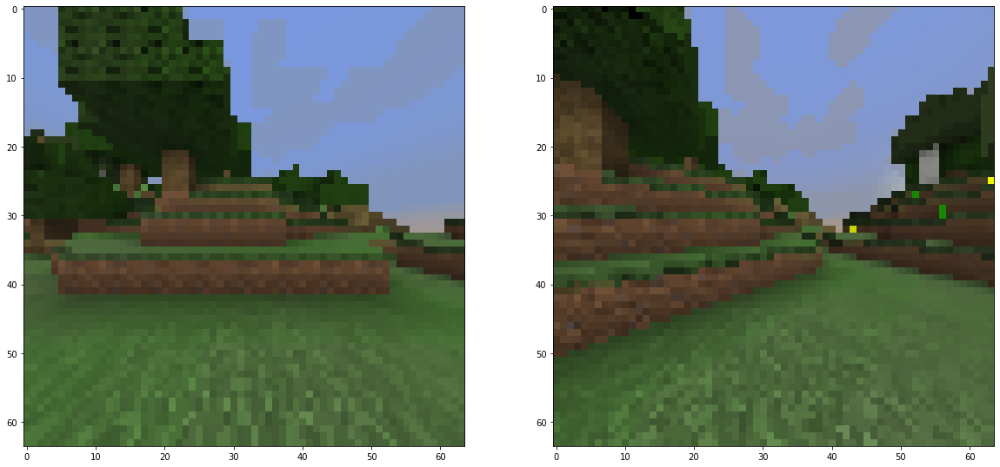

In [18]:
action_name = "camera_yaw_30"
sample = 1
frame = 6

sample = dataset[action_name][sample]

first_frame = sample["frames"][frame]

second_frame = sample["frames"][frame + 1]

action = sample["actions"][frame]
print(action)
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(first_frame)
plt.subplot(1, 2, 2)
plt.imshow(second_frame)
plt.show()

pose: [[ 0.         0.         0.        -0.         0.5235988  0.       ]], loss RGB: 3.9694387912750244, loss HS 3.7412109375


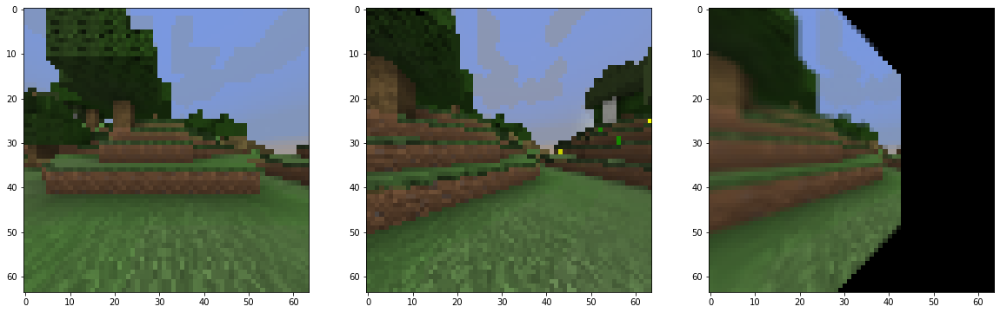

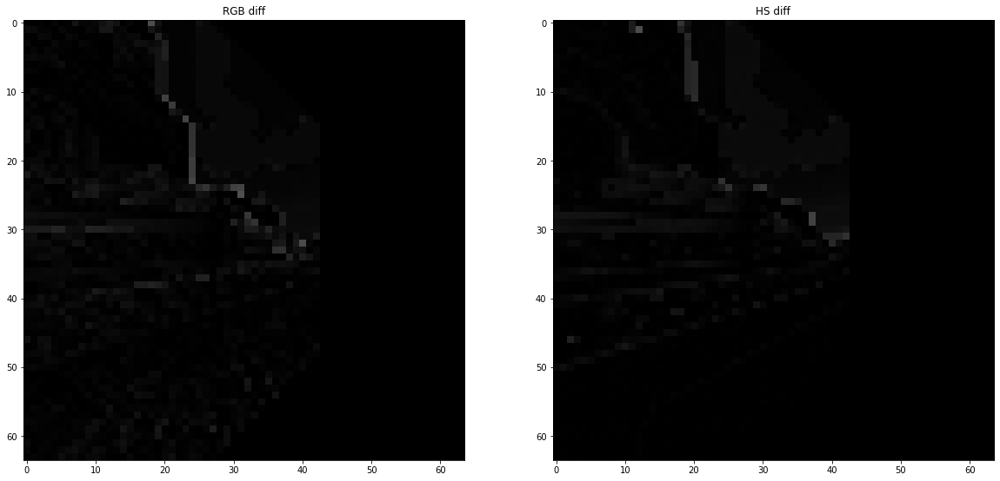

In [19]:
pose = np.array([0, 0, 0, deg2rad_pitch(action["camera"][0]), deg2rad_yaw(action["camera"][1]), 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics())

pose: [[ 0.         0.         0.        -0.         0.5235988  0.       ]], loss RGB: 3.9694387912750244, loss HS 3.7412109375


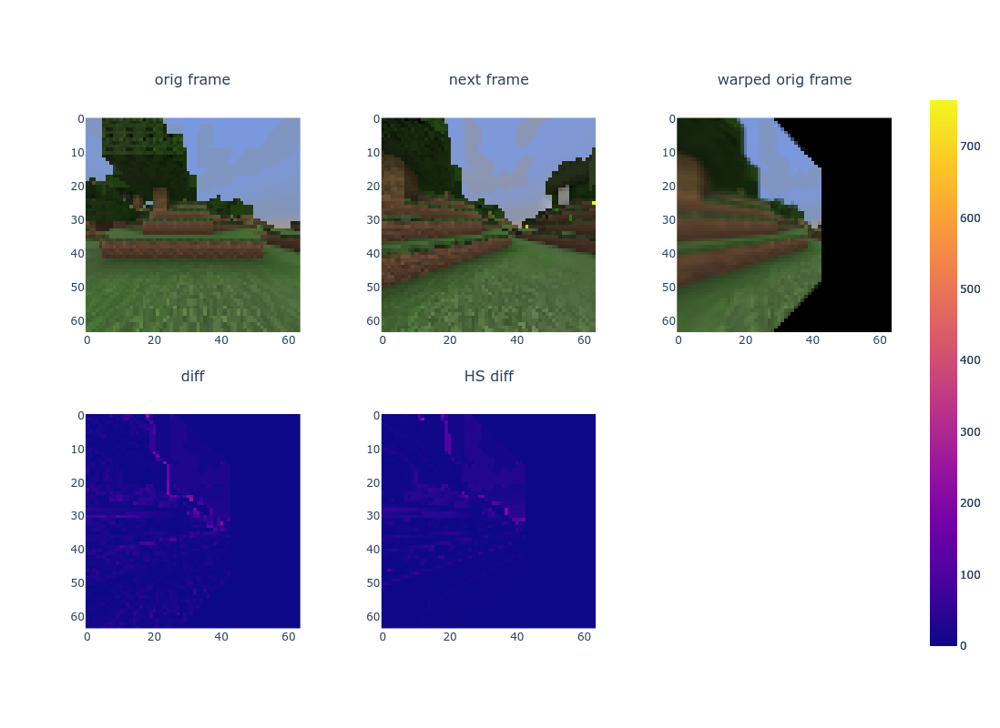

In [20]:
pose = np.array([0, 0, 0, deg2rad_pitch(action["camera"][0]), deg2rad_yaw(action["camera"][1]), 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics(), interactive=True)

## Rotation: pitch

### 5deg

OrderedDict([('attack', 0), ('back', 0), ('camera', array([5, 0])), ('forward', 0), ('jump', 0), ('left', 0), ('right', 0), ('sneak', 0), ('sprint', 0)])


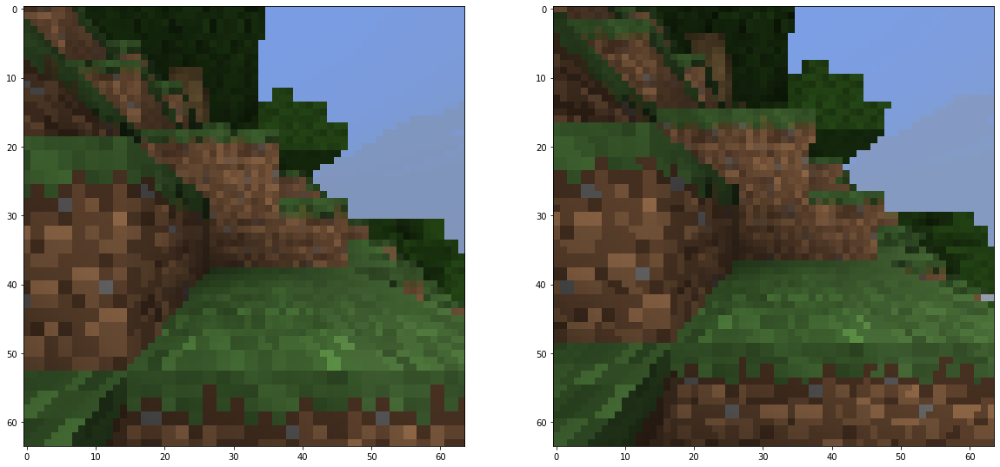

In [21]:
action_name = "camera_pitch_5"
sample = 0
frame = 0

sample = dataset[action_name][sample]

first_frame = sample["frames"][frame]

second_frame = sample["frames"][frame + 1]

action = sample["actions"][frame]
print(action)
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(first_frame)
plt.subplot(1, 2, 2)
plt.imshow(second_frame)
plt.show()

pose: [[ 0.          0.          0.         -0.08726646  0.          0.        ]], loss RGB: 4.949335098266602, loss HS 3.4619140625


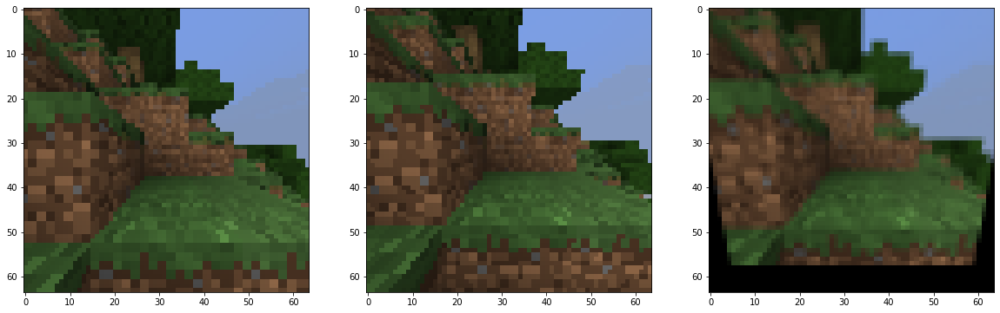

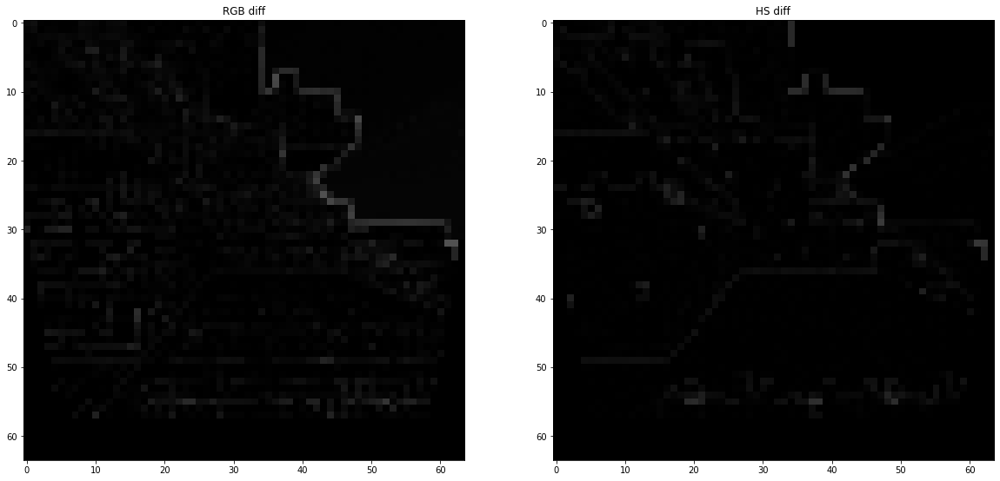

In [22]:
pose = np.array([0, 0, 0, deg2rad_pitch(action["camera"][0]), deg2rad_yaw(action["camera"][1]), 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics())

pose: [[ 0.          0.          0.         -0.08726646  0.          0.        ]], loss RGB: 4.949335098266602, loss HS 3.4619140625


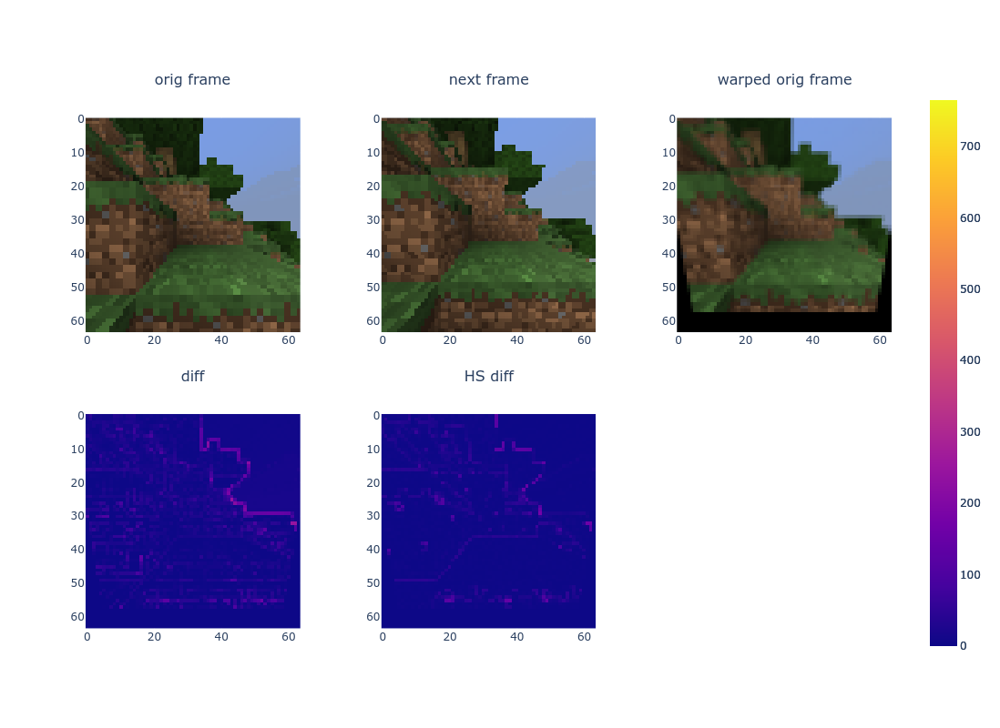

In [23]:
pose = np.array([0, 0, 0, deg2rad_pitch(action["camera"][0]), deg2rad_yaw(action["camera"][1]), 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics(), interactive=True)

### -5deg

OrderedDict([('attack', 0), ('back', 0), ('camera', array([-5,  0])), ('forward', 0), ('jump', 0), ('left', 0), ('right', 0), ('sneak', 0), ('sprint', 0)])


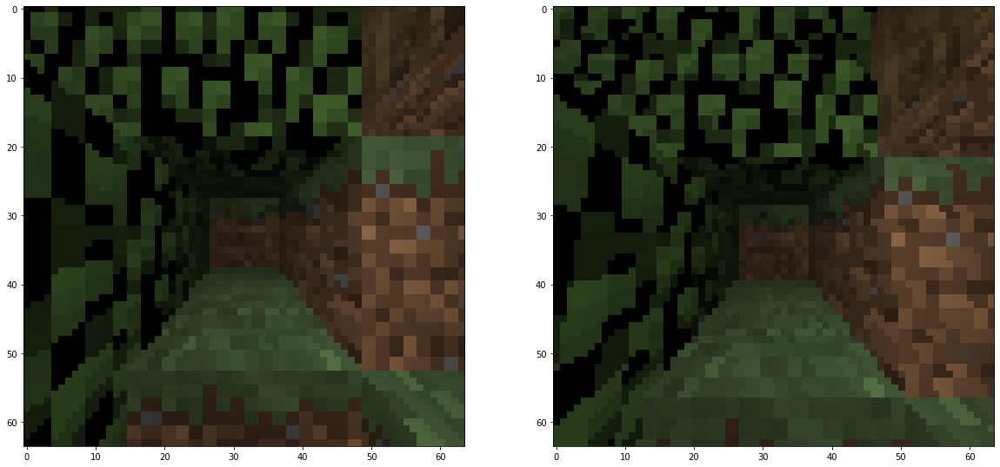

In [24]:
action_name = "camera_pitch_-5"
sample = 2
frame = 0

sample = dataset[action_name][sample]

first_frame = sample["frames"][frame]

second_frame = sample["frames"][frame + 1]

action = sample["actions"][frame]
print(action)
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(first_frame)
plt.subplot(1, 2, 2)
plt.imshow(second_frame)
plt.show()

pose: [[0.         0.         0.         0.08726646 0.         0.        ]], loss RGB: 3.6923768520355225, loss HS 7.503173828125


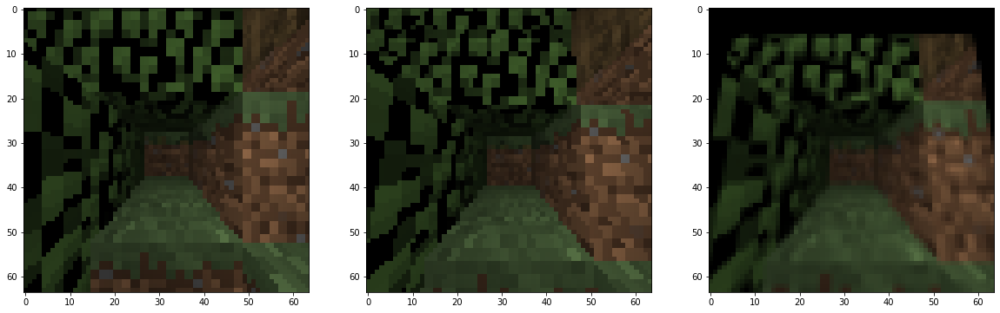

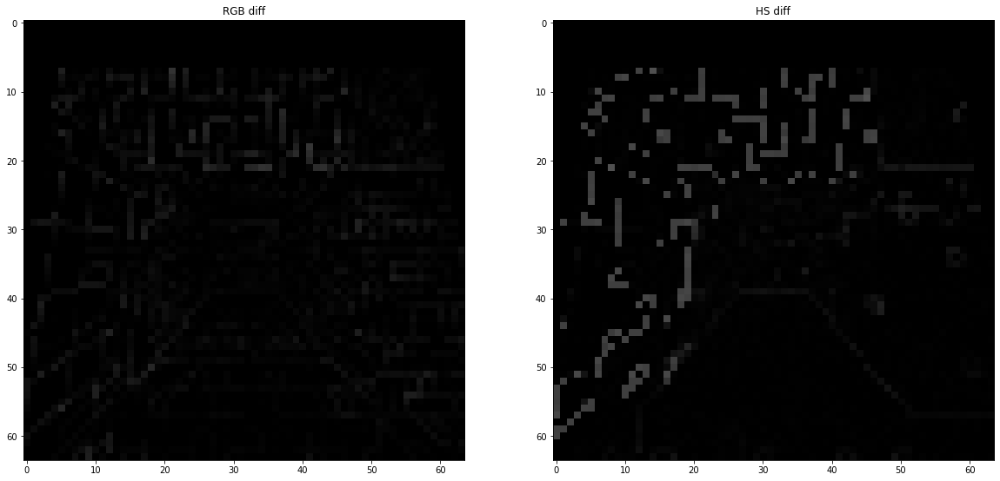

In [25]:
pose = np.array([0, 0, 0, deg2rad_pitch(action["camera"][0]), deg2rad_yaw(action["camera"][1]), 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics())

pose: [[0.         0.         0.         0.08726646 0.         0.        ]], loss RGB: 3.6923768520355225, loss HS 7.503173828125


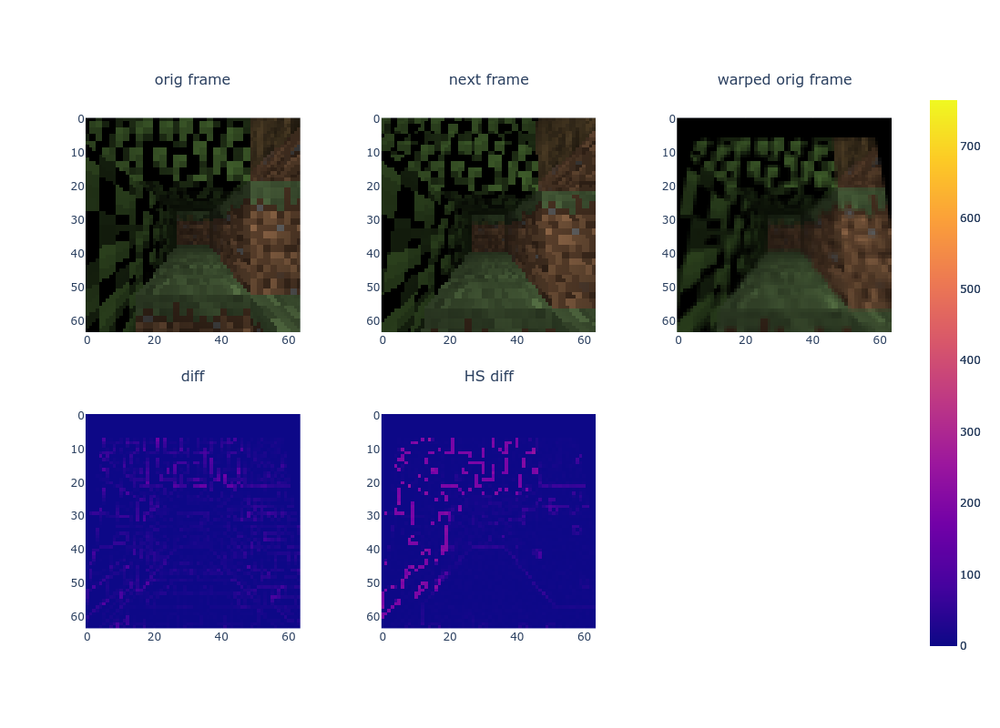

In [26]:
pose = np.array([0, 0, 0, deg2rad_pitch(action["camera"][0]), deg2rad_yaw(action["camera"][1]), 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics(), interactive=True)

### 10deg

OrderedDict([('attack', 0), ('back', 0), ('camera', array([10,  0])), ('forward', 0), ('jump', 0), ('left', 0), ('right', 0), ('sneak', 0), ('sprint', 0)])


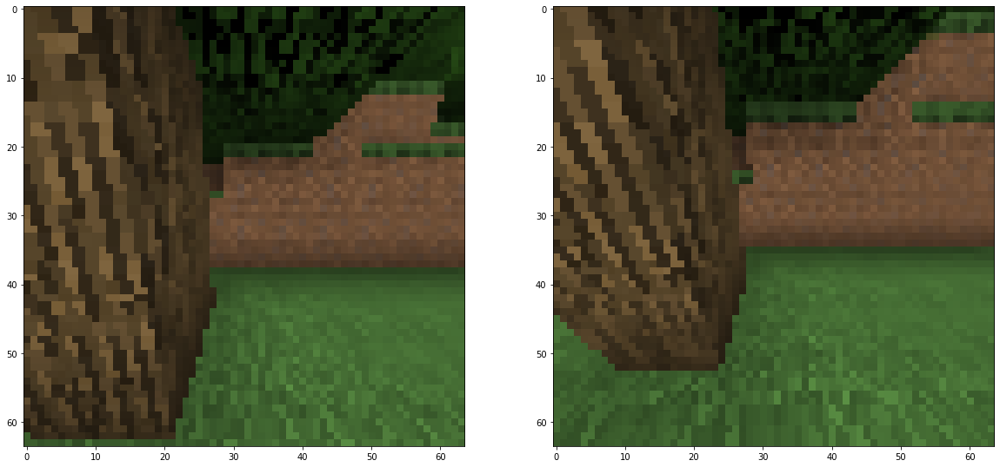

In [27]:
action_name = "camera_pitch_10"
sample = 1
frame = 1

sample = dataset[action_name][sample]

first_frame = sample["frames"][frame]

second_frame = sample["frames"][frame + 1]

action = sample["actions"][frame]
print(action)
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(first_frame)
plt.subplot(1, 2, 2)
plt.imshow(second_frame)
plt.show()

pose: [[ 0.          0.          0.         -0.17453292  0.          0.        ]], loss RGB: 4.188261032104492, loss HS 2.5767822265625


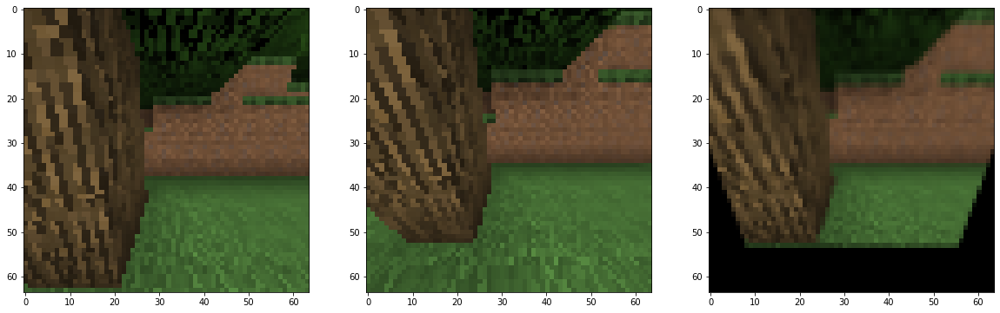

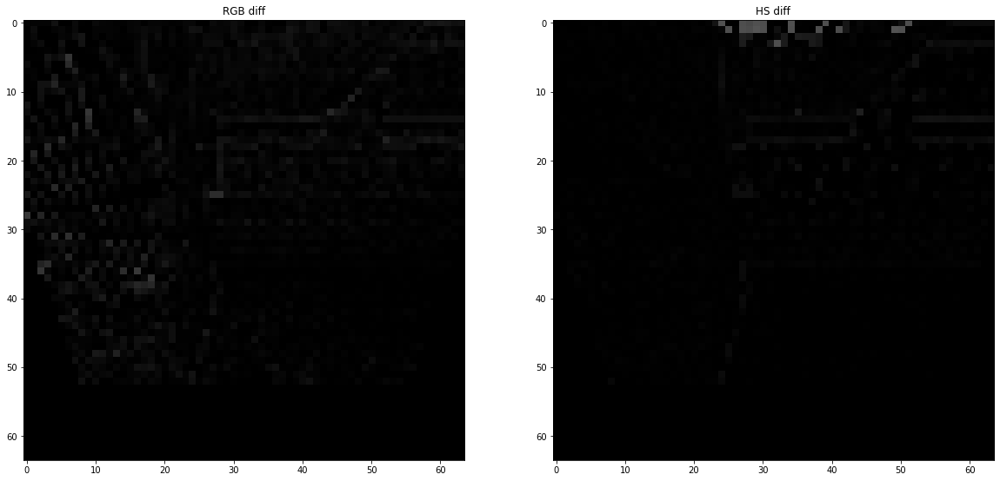

In [28]:
pose = np.array([0, 0, 0, deg2rad_pitch(action["camera"][0]), deg2rad_yaw(action["camera"][1]), 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics())

pose: [[ 0.          0.          0.         -0.17453292  0.          0.        ]], loss RGB: 4.188261032104492, loss HS 2.5767822265625


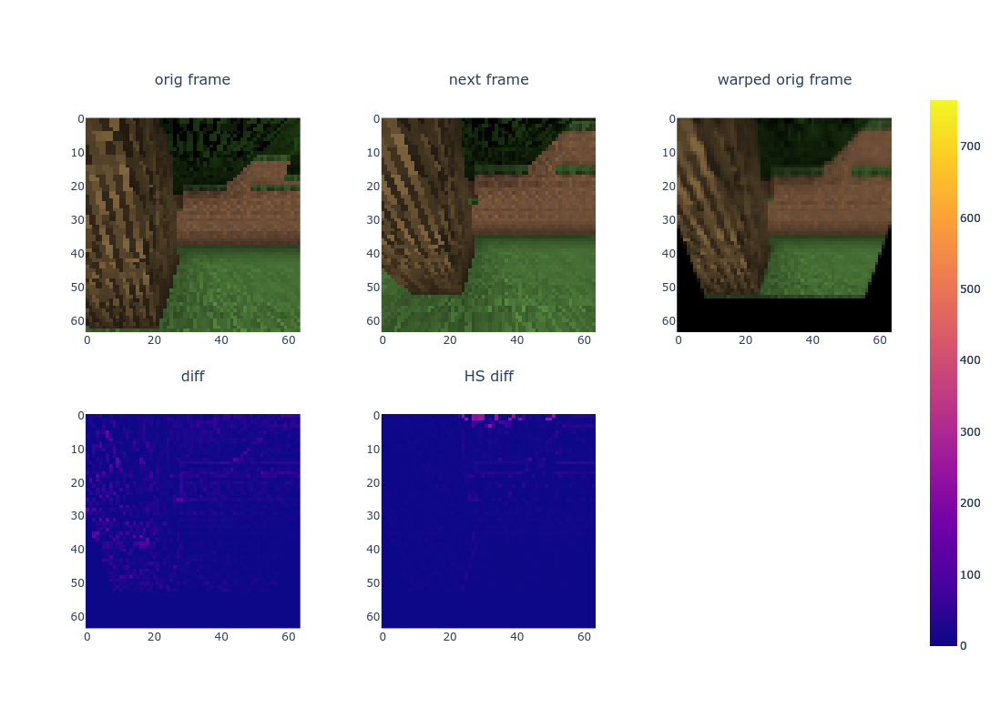

In [29]:
pose = np.array([0, 0, 0, deg2rad_pitch(action["camera"][0]), deg2rad_yaw(action["camera"][1]), 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics(), interactive=True)

### 30deg

OrderedDict([('attack', 0), ('back', 0), ('camera', array([30,  0])), ('forward', 0), ('jump', 0), ('left', 0), ('right', 0), ('sneak', 0), ('sprint', 0)])


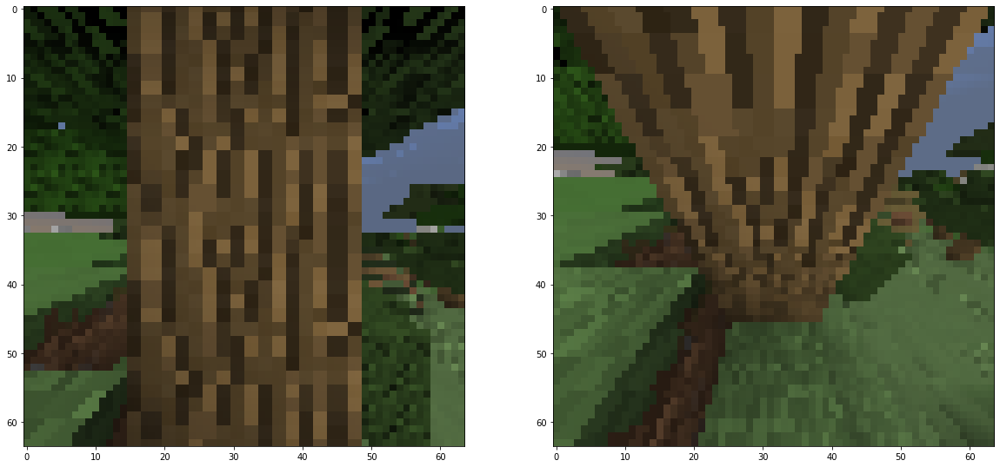

In [30]:
action_name = "camera_pitch_30"
sample = 0
frame = 0

sample = dataset[action_name][sample]

first_frame = sample["frames"][frame]

second_frame = sample["frames"][frame + 1]

action = sample["actions"][frame]
print(action)
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(first_frame)
plt.subplot(1, 2, 2)
plt.imshow(second_frame)
plt.show()

pose: [[ 0.         0.         0.        -0.5235988  0.         0.       ]], loss RGB: 5.263830661773682, loss HS 2.8310546875


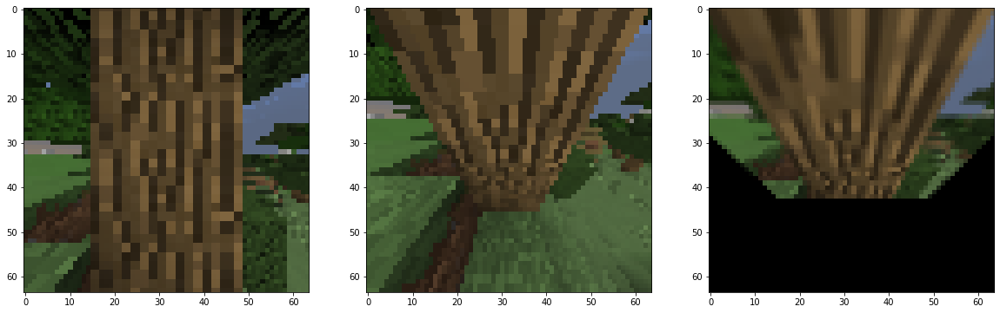

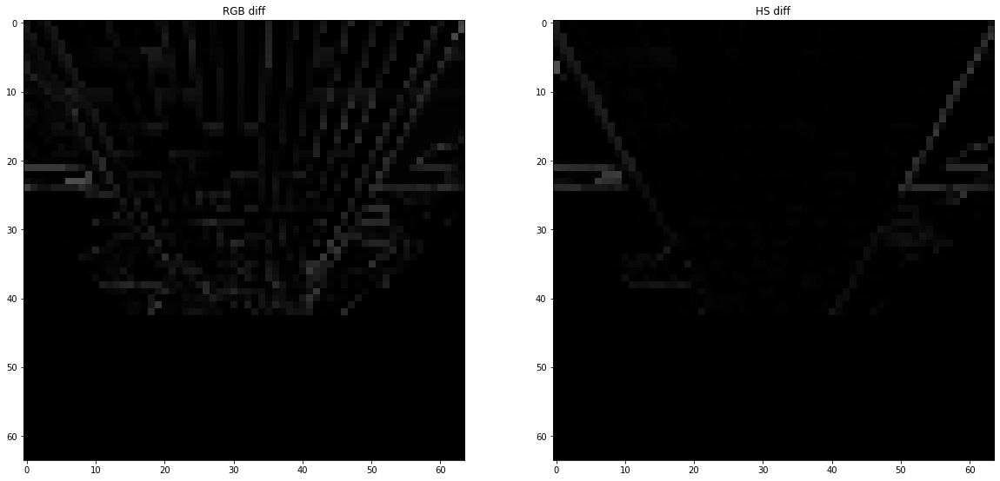

In [31]:
pose = np.array([0, 0, 0, deg2rad_pitch(action["camera"][0]), deg2rad_yaw(action["camera"][1]), 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics())

pose: [[ 0.         0.         0.        -0.5235988  0.         0.       ]], loss RGB: 5.263830661773682, loss HS 2.8310546875


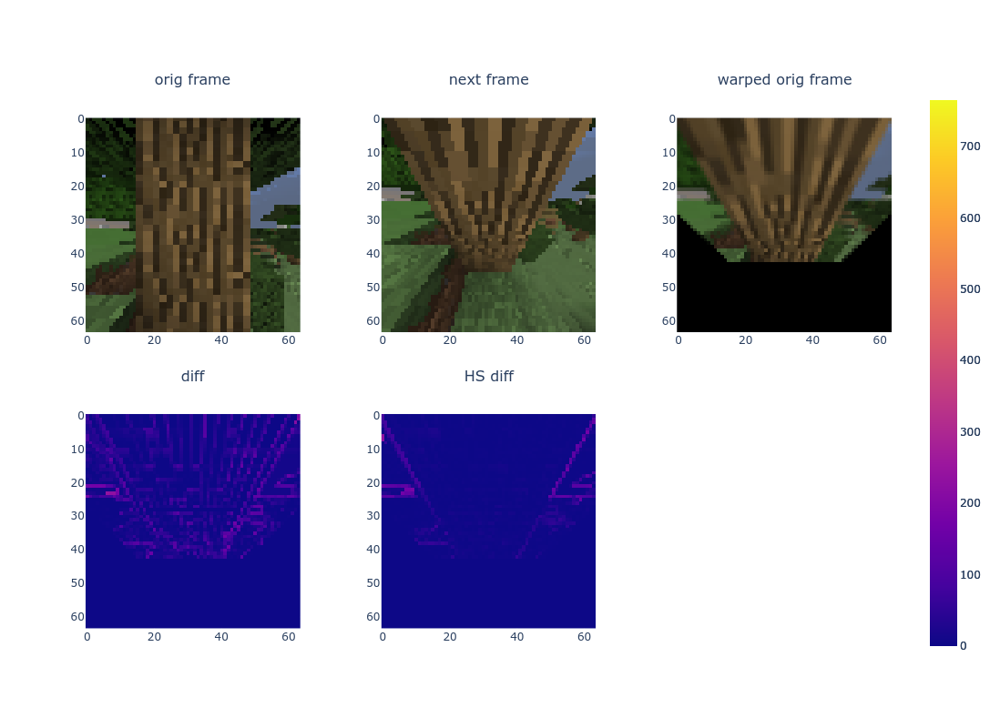

In [32]:
pose = np.array([0, 0, 0, deg2rad_pitch(action["camera"][0]), deg2rad_yaw(action["camera"][1]), 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics(), interactive=True)

## Translation

In [33]:
def pose_photmetric_loss(pose_val, pose_func, dataset_name, depth_tensor, intrinsics_tensor, frames_limit=-1, sample_limit=-1):
    pose = pose_func(pose_val)
    pose_tensor = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
    
    total_loss = 0
    
    for sample in dataset[dataset_name][:sample_limit]:
        frames = sample["frames"]
        
        for i, frame in enumerate(frames[:frames_limit]):
            if i + 1 < len(frames):
                frame_tensor = convert_frame_to_tensor(frame)
                second_frame_tensor = convert_frame_to_tensor(frame + 1)

                warped_frame_tensor, valid_points_tensor = inverse_warp(frame_tensor, depth_tensor, pose_tensor, intrinsics_tensor)

                diff_tensor = (second_frame_tensor - warped_frame_tensor) * valid_points_tensor.unsqueeze(1).float()

                total_loss += float(diff_tensor.abs().mean())

    return total_loss

In [34]:
import plotly.graph_objects as go
from plotly.offline import iplot

def plot_pose_loss(pose_val, pose_func, dataset_name, depth_tensor, intrinsics_tensor, frames_limit=-1, sample_limit=-1):
    pose = pose_func(pose_val)
    pose_tensor = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
    
    data = []
    
    for sample in dataset[dataset_name][:sample_limit]:
        frames = sample["frames"]
        
        losses = []
        
        for i, frame in enumerate(frames[:frames_limit]):
            if i + 1 < len(frames):
                frame_tensor = convert_frame_to_tensor(frame)
                second_frame_tensor = convert_frame_to_tensor(frame + 1)

                warped_frame_tensor, valid_points_tensor = inverse_warp(frame_tensor, depth_tensor, pose_tensor, intrinsics_tensor)

                diff_tensor = (second_frame_tensor - warped_frame_tensor) * valid_points_tensor.unsqueeze(1).float()

                losses.append(float(diff_tensor.abs().mean()))
                                
        data.append(go.Scatter(x=list(range(len(losses))), y=losses))
        
    fig = go.Figure(data=data)
    
    fig.update_layout(
        title="pose loss",
        xaxis_title=f"{pose_val[0]} pose val",
        yaxis_title="photometric loss"
    )

    iplot(fig)

### forward

In [35]:
from scipy import optimize

ranges = (slice(0, 10, 0.5),)

pose_func = lambda p: np.array([0, 0, p[0], 0, 0, 0])

params = (pose_func, "forward", depth_plane(), intrinsics(), 5)

resbrute = optimize.brute(pose_photmetric_loss, ranges, args=params, full_output=True, finish=optimize.fmin)
resbrute

(array([0.0278125]),
 244.86073178052902,
 array([0. , 0.5, 1. , 1.5, 2. , 2.5, 3. , 3.5, 4. , 4.5, 5. , 5.5, 6. ,
        6.5, 7. , 7.5, 8. , 8.5, 9. , 9.5]),
 array([ 245.00002962,  324.07410014,  454.63089693,  588.19122469,
         717.11027443,  839.26875854,  954.07347131, 1061.49585366,
        1161.83443856, 1255.71156597, 1344.43503881, 1423.77663875,
        1498.14907718, 1568.60048652, 1636.30592227, 1702.5932374 ,
        1766.64281607, 1829.45812893, 1890.81095743, 1951.03086662]))

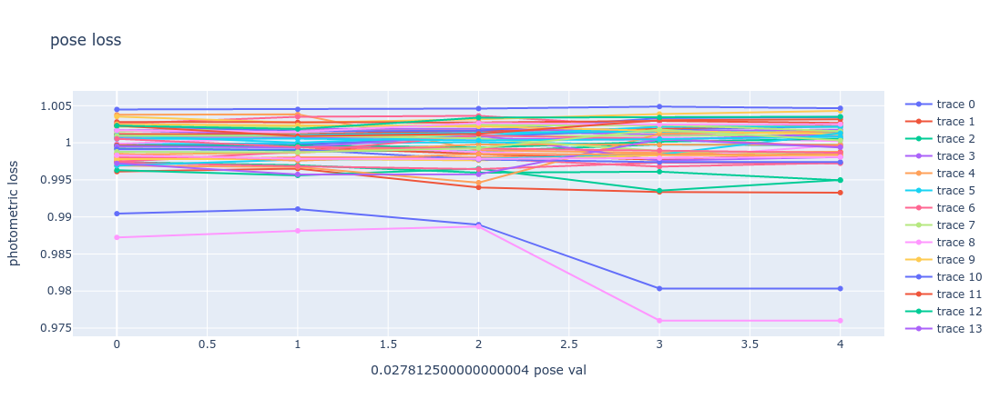

In [36]:
plot_pose_loss(resbrute[0], pose_func, "forward", depth_plane(), intrinsics(), 5)

### left

In [37]:
from scipy import optimize

ranges = (slice(0, 10, 0.5),)

pose_func = lambda p: np.array([0, 0, p[0], 0, 0, 0])

params = (pose_func, "left", depth_plane(), intrinsics(), 5)

resbrute = optimize.brute(pose_photmetric_loss, ranges, args=params, full_output=True, finish=optimize.fmin)
resbrute

(array([-0.0269375]),
 229.81681716442108,
 array([0. , 0.5, 1. , 1.5, 2. , 2.5, 3. , 3.5, 4. , 4.5, 5. , 5.5, 6. ,
        6.5, 7. , 7.5, 8. , 8.5, 9. , 9.5]),
 array([ 244.99994934,  327.39664602,  463.90395725,  603.45053446,
         737.87001896,  864.92137122,  983.94872212, 1094.90516186,
        1198.11485577, 1294.25992894, 1384.46290922, 1465.67222738,
        1540.57004881, 1611.24495363, 1677.96448565, 1742.66892195,
        1804.27451277, 1864.43960524, 1922.82528448, 1979.6740737 ]))

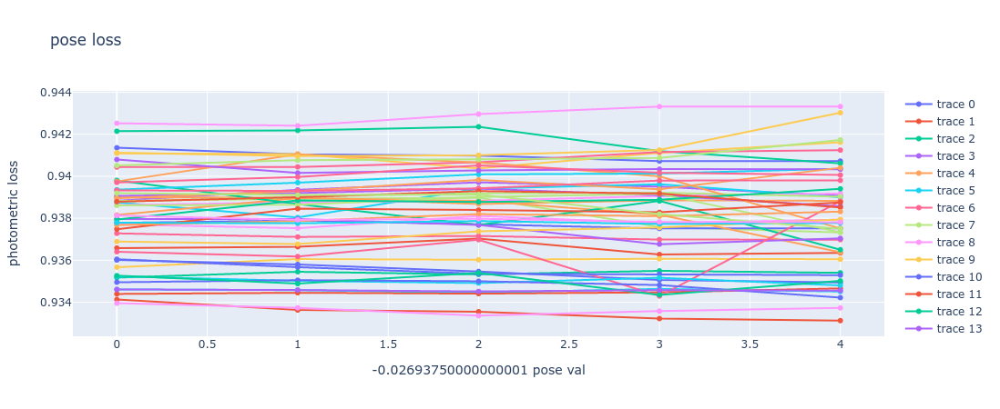

In [38]:
plot_pose_loss(resbrute[0], pose_func, "left", depth_plane(), intrinsics(), 5)

### right

In [39]:
from scipy import optimize

ranges = (slice(0, 10, 0.5),)

pose_func = lambda p: np.array([0, 0, p[0], 0, 0, 0])

params = (pose_func, "right", depth_plane(), intrinsics(), 5)

resbrute = optimize.brute(pose_photmetric_loss, ranges, args=params, full_output=True, finish=optimize.fmin)
resbrute

(array([-0.0340625]),
 231.7886608839035,
 array([0. , 0.5, 1. , 1.5, 2. , 2.5, 3. , 3.5, 4. , 4.5, 5. , 5.5, 6. ,
        6.5, 7. , 7.5, 8. , 8.5, 9. , 9.5]),
 array([ 247.17034203,  319.70981109,  443.21241415,  570.74305308,
         694.15359688,  811.18911743,  921.15879917, 1023.94779205,
        1119.83928013, 1209.41167617, 1293.68878889, 1369.50212646,
        1439.25743103, 1505.6763463 , 1568.67711973, 1630.01071167,
        1688.10905886, 1744.91286469, 1800.32288885, 1854.03017426]))

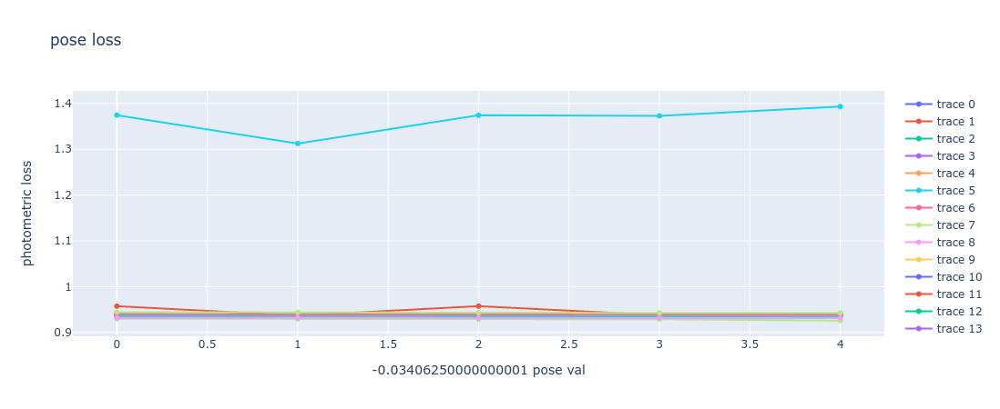

In [40]:
plot_pose_loss(resbrute[0], pose_func, "right", depth_plane(), intrinsics(), 5)

# Video

## minerl